# StyleGAN demonstration notebook 
Author: René Haas (renha@itu.dk)

This notebook demonstrates some of the capabilities of Nvidia's StyleGAN model. 
We use StyleGAN2 (https://arxiv.org/abs/1912.04958)

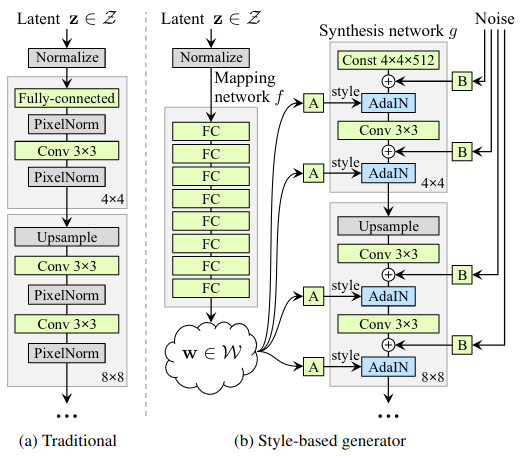

In this notebook we will learn to:

- Generate photorealistic face portraits with StyleGAN
- Perform linear interpolation to morph between portraits.
- Perform PCA in $\mathcal{W}$ space to discover meaningful semantic directions. 

### Install dependencies, clone StyleGAN3 repository and download pretrained StyleGAN2 model 

In [5]:
!pip install ninja
!git clone https://github.com/NVlabs/stylegan3.git
%cd stylegan3
# !wget https://api.ngc.nvidia.com/v2/models/nvidia/research/stylegan2/versions/1/files/stylegan2-ffhq-256x256.pkl
!wget https://api.ngc.nvidia.com/v2/models/nvidia/research/stylegan2/versions/1/files/stylegan2-ffhq-1024x1024.pkl


Cloning into 'stylegan3'...
remote: Enumerating objects: 207, done.
remote: Total 207 (delta 0), reused 0 (delta 0), pack-reused 207
Receiving objects: 100% (207/207), 4.17 MiB | 13.51 MiB/s, done.
Resolving deltas: 100% (99/99), done.
/Users/martinholst/Desktop/AML/exercises/w09_gans_interpretability/stylegan3/stylegan3/stylegan3
--2022-11-08 11:03:15--  https://api.ngc.nvidia.com/v2/models/nvidia/research/stylegan2/versions/1/files/stylegan2-ffhq-1024x1024.pkl
Resolving api.ngc.nvidia.com (api.ngc.nvidia.com)... 54.215.161.153, 54.177.25.114
Connecting to api.ngc.nvidia.com (api.ngc.nvidia.com)|54.215.161.153|:443... connected.
HTTP request sent, awaiting response... 302 
Location: https://prod-model-registry-ngc-bucket.s3.us-west-2.amazonaws.com/org/nvidia/team/research/models/stylegan2/versions/1/files/stylegan2-ffhq-1024x1024.pkl?response-content-disposition=attachment%3B%20filename%3D%22stylegan2-ffhq-1024x1024.pkl%22&response-content-type=application%2Foctet-stream&X-Amz-Securit

### Load the pretrained generator into memory and place on GPU

Make sure GPU is enabled in Colab (edit > notebook settings)

In [6]:
import torch 
import pickle

# model_path = "stylegan2-ffhq-256x256.pkl"
model_path = "stylegan2-ffhq-1024x1024.pkl"

device = "cuda" if torch.cuda.is_available() else "cpu"

with open(model_path, 'rb') as f: 
    G = pickle.load(f)['G_ema'].to(device) 

### Image synthesis

The process is as follows: 


- Draw latent code samples from a Gaussian $z\in \mathcal{Z}$ 
- Feed it through mapping network $f$ to obtain $f(z) = w \in \mathcal{W}$ 
- Feed the $ w$ vector through the synthesis network to obtain the synthetic image.

The first time the generator is run the PyTorch plugins "bias_act_plugin" and "upfirdn2d_plugin" are compiled - this might take a few minutes 

z shape: torch.Size([1, 512])
w shape: torch.Size([1, 18, 512])
torch img shape: torch.Size([1, 3, 1024, 1024])
numpy img shape: (1024, 1024, 3)


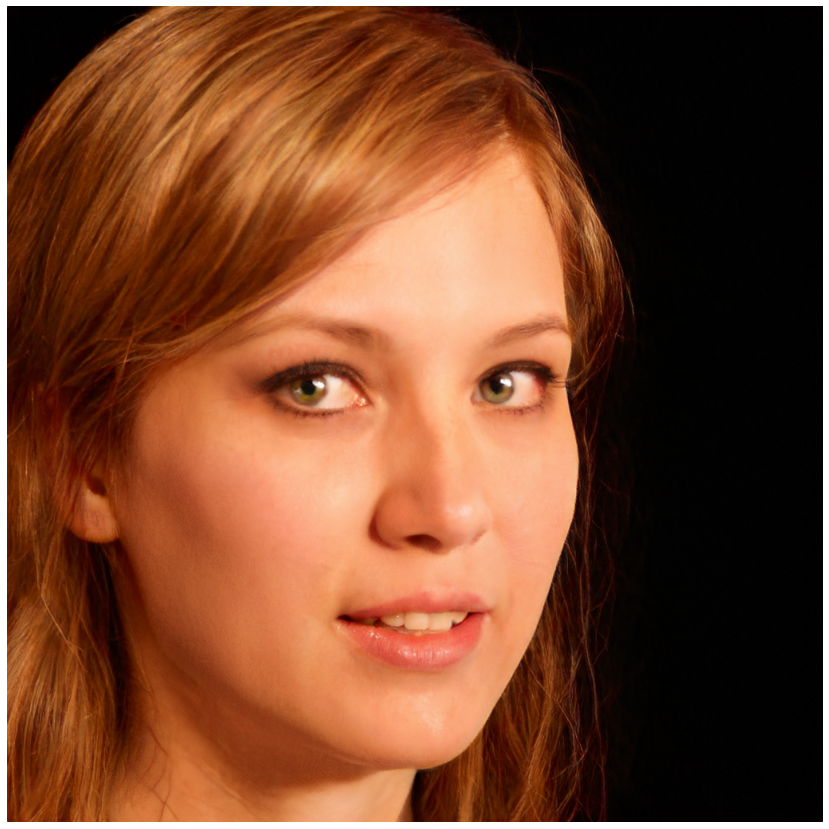

In [7]:
import matplotlib.pyplot as plt

def to_np_image(all_images):
    all_images = (all_images.permute(0, 2, 3, 1) * 127.5 + 128).clamp(0, 255).to(torch.uint8).cpu().numpy()[0]
    return all_images

# torch.manual_seed(7)

# Draw sample from multivariate gaussian N(0,I)
z = torch.randn([1, G.z_dim]).to(device=device)  # latent codes

# Feed latent code through the mapping network
w = G.mapping(z, None, truncation_psi=0.5, truncation_cutoff=8) 

# Feed lantent code to synthesis network
img = G.synthesis(w) 

# Convert to numpy format and plot
np_img = to_np_image(img)

plt.figure(figsize = (15,15))
plt.imshow(np_img)
plt.axis("off")

print("z shape:", z.shape)
print("w shape:", w.shape)
print("torch img shape:", img.shape)
print("numpy img shape:", np_img.shape)

# Example Linear Interpolation

Here we sample two latent codes $w_1$ and $w_2$ in $\mathcal{W}$ space and perform a linear interpolation between them:


\begin{align}
w = (1-t)w_1 + tw_2,  \quad t \in [0,1]
\end{align}

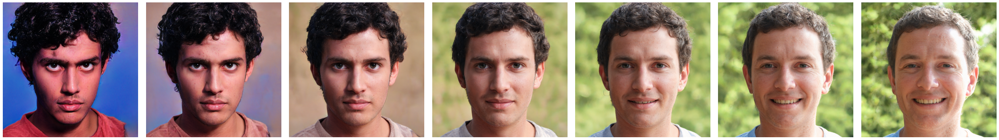

In [15]:

#torch.manual_seed(659)

def linear_interpolation(x,y,t):
    return x*(1-t) + t*y

# Draw two random latent codes
z = torch.randn([2, G.z_dim]).to(device=device) 
w = G.mapping(z, None, truncation_psi = 0.5, truncation_cutoff=8) 
w1,w2 = w[0:1],w[1:2] 

# Plot linear interpolation between them 
plt.figure(figsize = (35,5))
for i,t in enumerate(torch.linspace(0,1,7)):

    w = linear_interpolation(w1,w2,t)

    img = G.synthesis(w) 
    np_img = to_np_image(img)

    plt.subplot(1,7,i+1)
    plt.imshow(np_img)
    plt.axis("off")

plt.tight_layout()



# Principal component analysis

Here we perform PCA on latent codes in $\mathcal{W}$ space. 

We first sample 10k latent codes, then proceed to calculate the covariance matrix and its eigenvectors and finally plot the result of pertubing the "mean face" along the pricipal components. 

The code below is essentially a very minimal implementation of GANspace (https://arxiv.org/abs/2004.02546)

In this way we can find semantic directions in an unsupervised fashion in the $\mathcal{W}$ latent space which affects attribues like gender, pose direction and age. 

Note however that these directions are entangled, so each principle direction typically changes several attribues.

Principal component #1


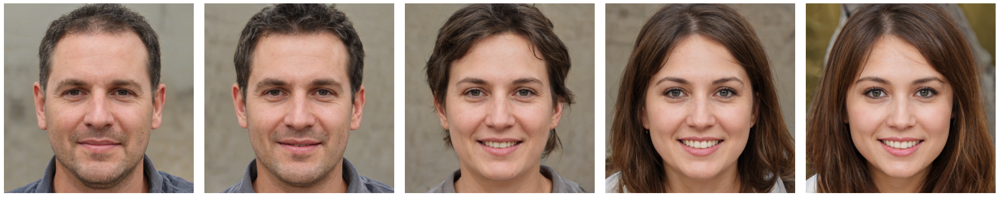

Principal component #2


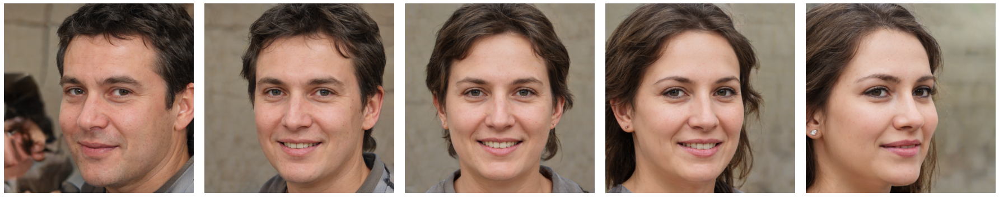

Principal component #3


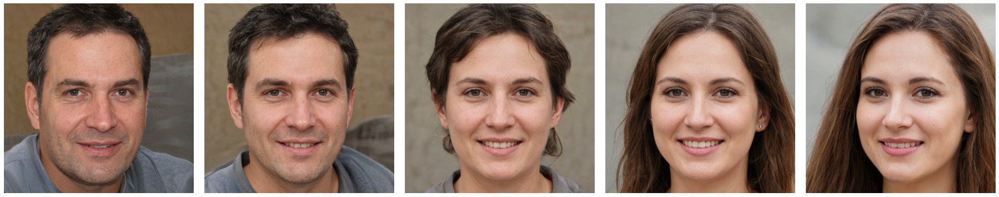

Principal component #4


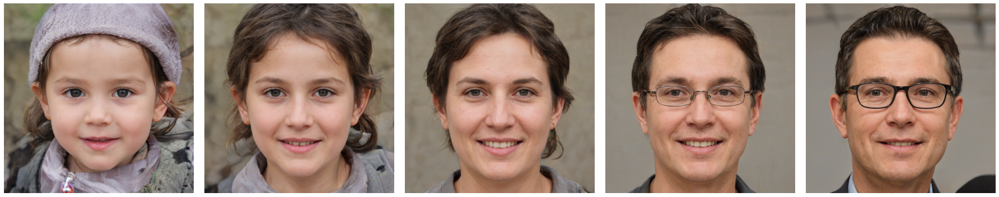

Principal component #5


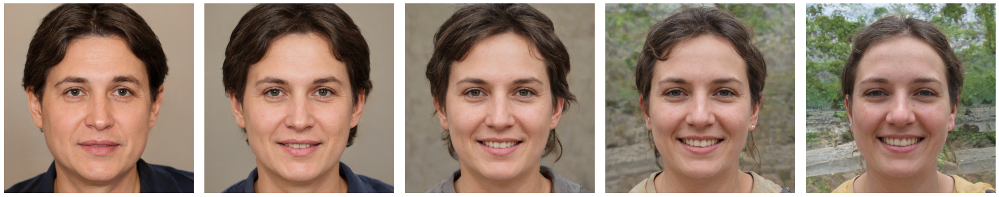

Principal component #6


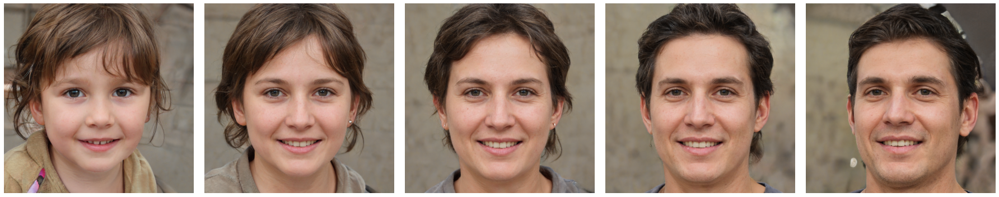

Principal component #7


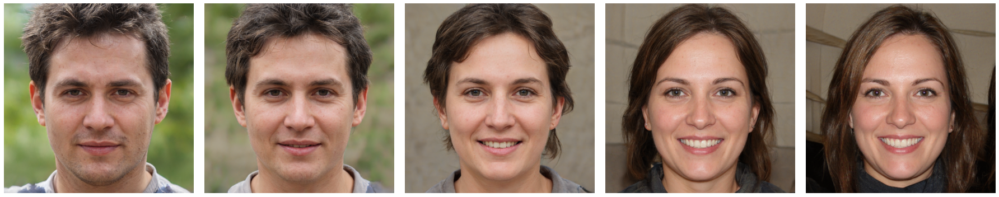

Principal component #8


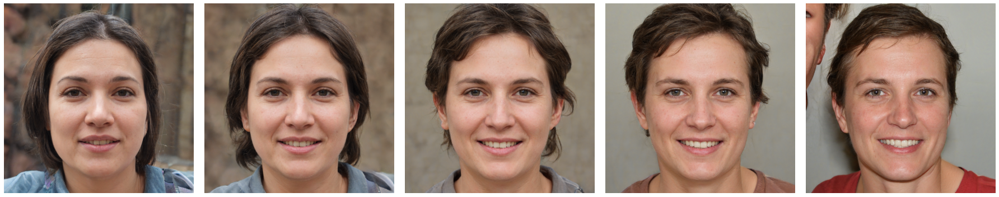

Principal component #9


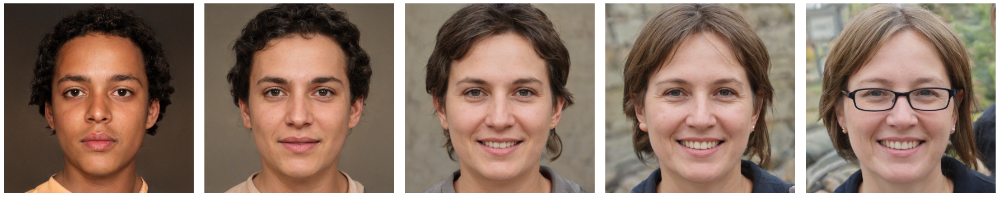

Principal component #10


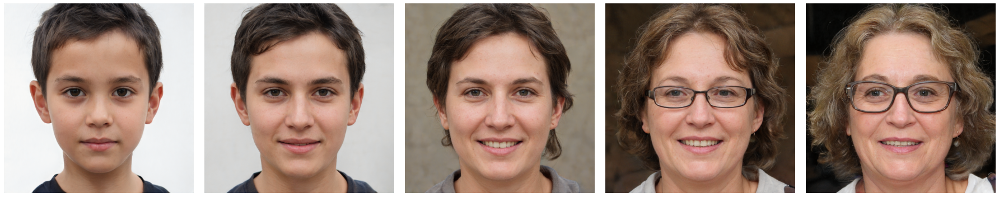

In [12]:
torch.manual_seed(42)

# Sample 10000 latent codes in Z space
z = torch.randn([10000, G.z_dim]).to(device=device)

# Map to W space
ws = G.mapping(z, None, truncation_psi=0.5, truncation_cutoff=8) 

# Select a single style vector for each latent code.
ws = ws[:,0,:]

# Calculate eigenvectors of the covariance matrix (PCA)
mean_w = ws.mean(0)
C = (ws - mean_w).T @ (ws - mean_w)
s, U = torch.linalg.eig(C)

# Plot the result of perturbing the "mean face" in the direction of the principal components
for j in range(10):
    plt.figure(figsize = (25,5))
    print(f"Principal component #{j+1}")
    for i,alpha in enumerate(torch.linspace(-5,5,5)):

        # Perturb in the direction of the principal components
        w = mean_w + alpha*U[:,j]

        # Reshape into correct format for synthesis network [1,18,512]
        w = w.repeat((G.num_ws,1)).unsqueeze(0)

        # Synthesize image
        img = G.synthesis(w) 
        
        # Convert to numpy format and plot
        plt.subplot(1,5,i+1)
        np_img = to_np_image(img)
        plt.imshow(np_img)
        plt.axis("off")
    plt.tight_layout()
    plt.show()

## Linear extrapolate

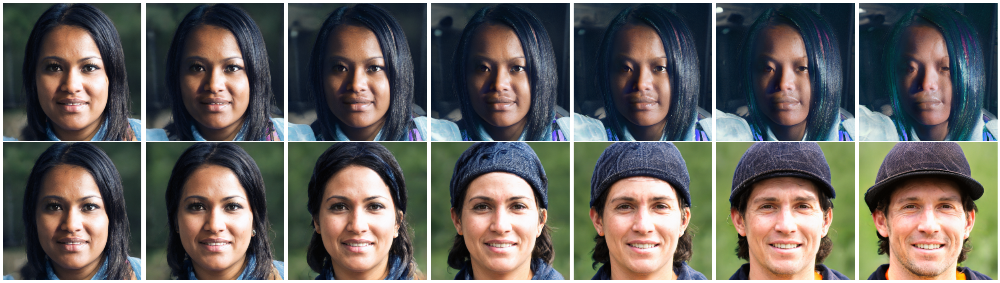

In [40]:
torch.manual_seed(659)

def linear_interpolation(x,y,t):
    return x*(1-t) + t*y

# Draw two random latent codes
z = torch.randn([2, G.z_dim]).to(device=device) 
w = G.mapping(z, None, truncation_psi = 0.5, truncation_cutoff=8) 
w1,w2 = w[0:1],w[1:2] 

# Plot linear interpolation between them 
fig = plt.figure(figsize= (35,10))
for i,t in enumerate(torch.linspace(0,-1,7)):
    w = linear_interpolation(w1, w2, t)
    img = G.synthesis(w) 
    np_img = to_np_image(img)
    fig.add_subplot(2, 7, i+1)
    plt.imshow(np_img)
    plt.axis('off')

for i,t in enumerate(torch.linspace(0,1,7)):
    w = linear_interpolation(w1,w2,t)
    img = G.synthesis(w) 
    np_img = to_np_image(img)

    fig.add_subplot(2, 7, i+1+7)
    plt.imshow(np_img)
    plt.axis('off')
plt.tight_layout()